<a href="https://colab.research.google.com/github/rs-fagundes/media-measurement-triad/blob/main/dataWithJavi_synthetic_data_MMM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generating Synthetic Data

The following code is dedicated to generating a synthetic dataset with some "ground truths" embedded in the data. We will then run a meridian MMM analysis and see how well this ground truths where observed by the the model.


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Set random seed for reproducibility
np.random.seed(42)

# Simulation parameters
num_weeks = 156  # 3 years of weekly data
geos = ['ES', 'UK', 'DE', 'FR']  # Geos
channels = ['facebook_brand', 'facebook_conversion', 'youtube_brand',
            'google_search_branded', 'google_search_non_branded']
control_vars = ['Seasonality', 'Google_Query_Volume', 'Economic_Factor']
kpi_name = "Revenue"  # KPI

# Define ground truth coefficients with variability
ground_truth_base = {
    'baseline': 50,
    'facebook_brand': np.random.uniform(0.3, 0.5),
    'facebook_conversion': np.random.uniform(0.45, 0.7),
    'youtube_brand': np.random.uniform(0.3, 0.6),
    'google_search_branded': np.random.uniform(0.45, 0.65),
    'google_search_non_branded': np.random.uniform(0.5, 0.8),
    'Seasonality': 60,             # Seasonal fluctuations
    'Google_Query_Volume': 0.6,       # Impact of search trends
    'Economic_Factor': 30,         # Economic impact on conversions
    'revenue_per_kpi': np.random.uniform(50, 250)  # Revenue per conversion unit
}

# Create a date range
dates = pd.date_range(start="2022-01-01", periods=num_weeks, freq="W")

# Initialize DataFrame with Geo and Date
df = pd.DataFrame([(geo, date) for geo in geos for date in dates], columns=["Geo", "Date"])

# Define geo-specific multipliers for each channel
channel_geo_multiplier = {
    'facebook_brand': {'ES': 1.2, 'UK': 1.3, 'DE': 1.1, 'FR': 1.2},
    'facebook_conversion': {'ES': 1.2, 'UK': 1.0, 'DE': 1.1, 'FR': 0.8},
    'youtube_brand': {'ES': 0.8, 'UK': 1.3, 'DE': 1.0, 'FR': 1.1},
    'google_search_branded': {'ES': 1.1, 'UK': 1.2, 'DE': 1.2, 'FR': 1.0},
    'google_search_non_branded': {'ES': 0.9, 'UK': 1.1, 'DE': 1.0, 'FR': 1.3},
}

# Simulate media spend with geo-specific variations
for channel in channels:
    base_spend = np.random.uniform(200, 2000, len(df))
    geo_multiplier = df["Geo"].apply(lambda g: channel_geo_multiplier[channel][g]).values
    campaign_spikes = np.random.choice([1, 1.5, 2], size=len(df), p=[0.75, 0.20, 0.05])
    df[channel] = base_spend * geo_multiplier * campaign_spikes

# Media Exposure Modeling
exposure_efficiency = {
    'facebook_brand': np.random.uniform(0.5, 0.6),
    'facebook_conversion': np.random.uniform(0.6, 0.8),
    'youtube_brand': np.random.uniform(0.4, 0.8),
    'google_search_branded': np.random.uniform(0.6, 0.8),
    'google_search_non_branded': np.random.uniform(0.5, 0.9),
}

for channel in channels:
    efficiency = exposure_efficiency[channel]
    noise = np.random.normal(1, 0.1, len(df))  # Small variation
    df[f"{channel}_exposure"] = efficiency * np.log1p(df[channel]) * noise

# Control Variables
df["Seasonality"] = df["Date"].dt.isocalendar().week.apply(lambda x: np.sin(2 * np.pi * x / 52))
df["Google_Query_Volume"] = np.random.uniform(50, 100, len(df))
df["Economic_Factor"] = np.random.normal(0, 1, len(df))

# Geo Population
df["Geo_Population"] = df["Geo"].map({"ES": 47_000_000, "UK": 68_000_000, "DE": 83_000_000, "FR": 67_000_000})

# Weekly coefficients variability
weekly_coefficients = {
    channel: ground_truth_base[channel] + np.random.normal(0, 0.15, len(df))
    for channel in channels
}

# Simulate Conversions
df["Conversions"] = (
    ground_truth_base["baseline"]
    + sum(df[channel] * weekly_coefficients[channel] for channel in channels)
    + df["Seasonality"] * ground_truth_base["Seasonality"]
    + df["Google_Query_Volume"] * ground_truth_base["Google_Query_Volume"]
    + df["Economic_Factor"] * ground_truth_base["Economic_Factor"]
    + np.random.normal(0, 500, len(df))
)

# Calculate Revenue from Conversions
df["Revenue"] = df["Conversions"] * ground_truth_base["revenue_per_kpi"]

# Display first few rows
print(df.head())



  Geo       Date  facebook_brand  facebook_conversion  youtube_brand  \
0  ES 2022-01-02      365.460602          1720.821020     985.881690   
1  ES 2022-01-09     3166.410712          1169.460733    1536.707887   
2  ES 2022-01-16     1538.408425           673.133410     897.366605   
3  ES 2022-01-23     1769.436768          1952.766331     476.010694   
4  ES 2022-01-30      284.462508           378.691304    2084.557849   

   google_search_branded  google_search_non_branded  facebook_brand_exposure  \
0            1993.214439                2252.261275                 2.897249   
1            2020.167023                1721.469079                 3.745280   
2             841.478591                 817.689543                 3.772622   
3            2382.435764                1420.448652                 3.768829   
4             757.833699                1564.366777                 3.548001   

   facebook_conversion_exposure  youtube_brand_exposure  \
0                      6.48

# Running EDA on Synthetic Data


In [ ]:
df.head()

,Geo,Date,facebook_brand,facebook_conversion,youtube_brand,google_search_branded,google_search_non_branded,facebook_brand_exposure,facebook_conversion_exposure,youtube_brand_exposure,google_search_branded_exposure,google_search_non_branded_exposure,Seasonality,Google_Query_Volume,Economic_Factor,Geo_Population,Conversions,Revenue
0,ES,2022-01-02,365.460602,1720.821020,985.881690,1993.214439,2252.261275,2.897249,6.480289,5.367861,4.941806,5.627361,6.432491e-16,58.604993,-0.458388,47000000,4040.921489,328118.396328
1,ES,2022-01-09,3166.410712,1169.460733,1536.707887,2020.167023,1721.469079,3.745280,4.969111,4.975775,4.957781,5.143576,1.205367e-01,65.271585,0.006021,47000000,4800.551162,389799.493234
2,ES,2022-01-16,1538.408425,673.133410,897.366605,841.478591,817.689543,3.772622,5.468627,5.204589,5.093141,4.243862,2.393157e-01,66.073124,-1.553647,47000000,3022.878889,245454.452936
3,ES,2022-01-23,1769.436768,1952.766331,476.010694,2382.435764,1420.448652,3.768829,5.734272,4.407880,4.364111,5.690349,3.546049e-01,57.981497,0.139041,47000000,4949.751039,401914.359745
4,ES,2022-01-30,284.462508,378.691304,2084.557849,757.833699,1564.366777,3.548001,4.858531,4.711884,4.571485,4.590473,4.647232e-01,60.259142,-0.316707,47000000,3219.772747,261442.018432


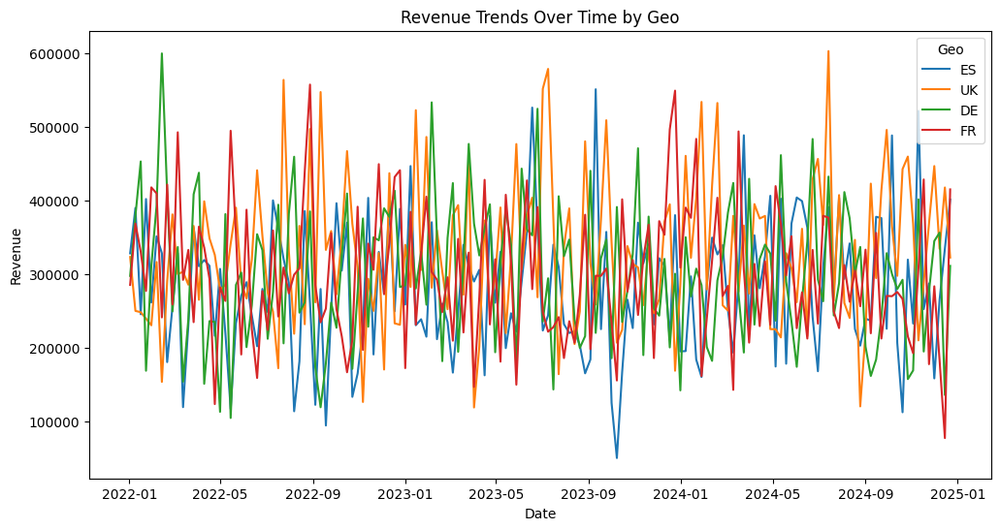

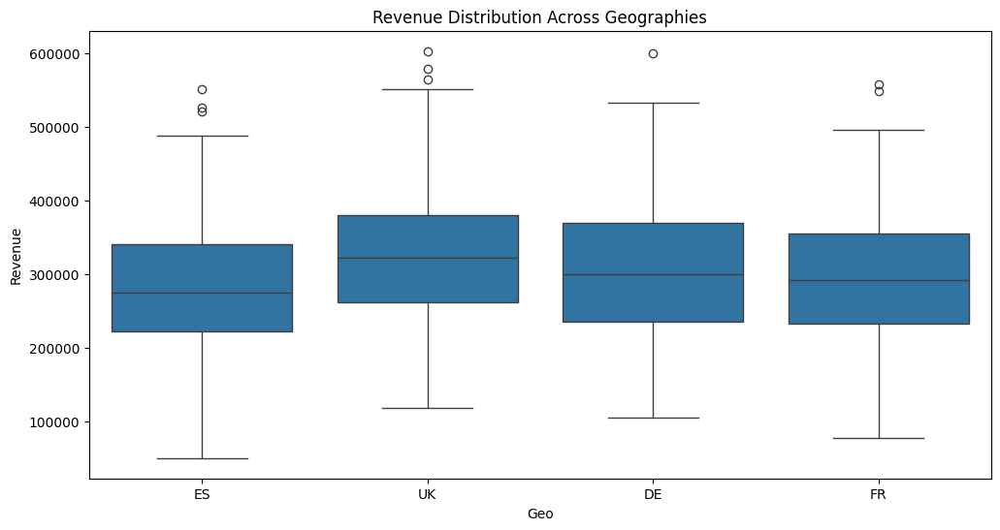

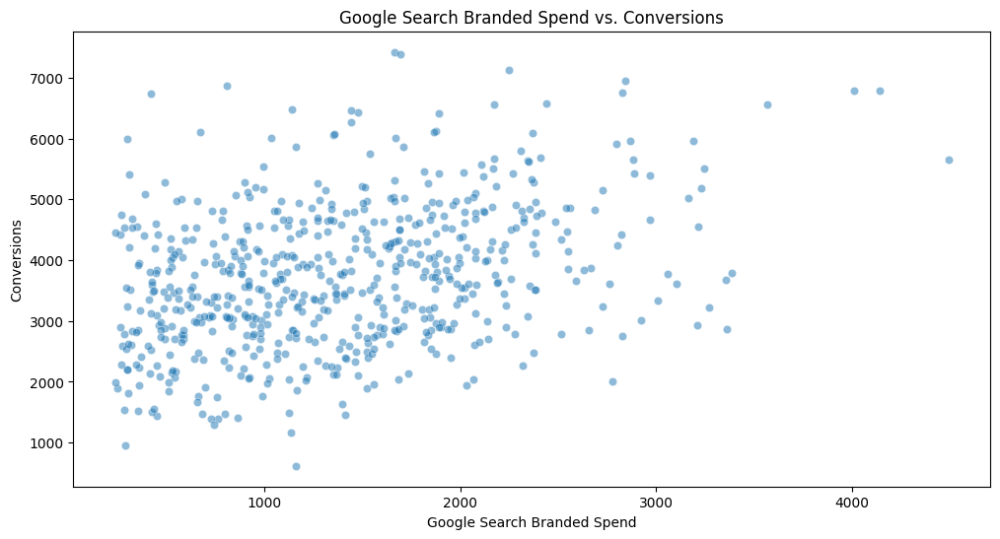

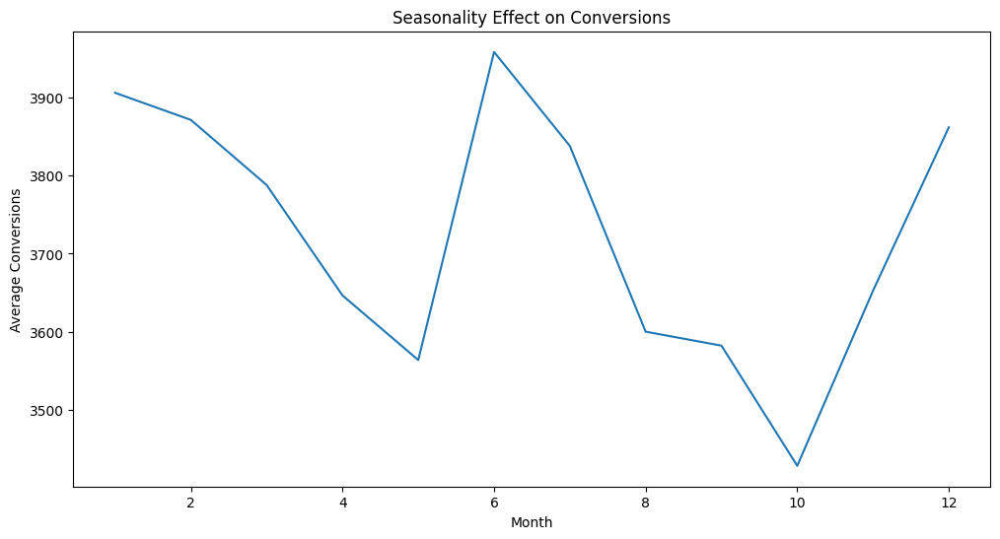

In [ ]:
# Deep EDA

plt.figure(figsize=(12, 6))
sns.lineplot(data=df, x="Date", y="Revenue", hue="Geo")
plt.title("Revenue Trends Over Time by Geo")
plt.show()

plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x="Geo", y="Revenue")
plt.title("Revenue Distribution Across Geographies")
plt.show()

plt.figure(figsize=(12, 6))
sns.scatterplot(data=df, x="google_search_branded", y="Conversions", alpha=0.5)
plt.title("Google Search Branded Spend vs. Conversions")
plt.xlabel("Google Search Branded Spend")
plt.ylabel("Conversions")
plt.show()

plt.figure(figsize=(12, 6))
df.groupby(df["Date"].dt.month)["Conversions"].mean().plot()
plt.title("Seasonality Effect on Conversions")
plt.xlabel("Month")
plt.ylabel("Average Conversions")
plt.show()


Geo                                   0
Date                                  0
facebook_brand                        0
facebook_conversion                   0
youtube_brand                         0
google_search_branded                 0
google_search_non_branded             0
facebook_brand_exposure               0
facebook_conversion_exposure          0
youtube_brand_exposure                0
google_search_branded_exposure        0
google_search_non_branded_exposure    0
Seasonality                           0
Google_Query_Volume                   0
Economic_Factor                       0
Geo_Population                        0
Conversions                           0
Revenue                               0
dtype: int64
Geo                                           object
Date                                  datetime64[ns]
facebook_brand                               float64
facebook_conversion                          float64
youtube_brand                                float64
go

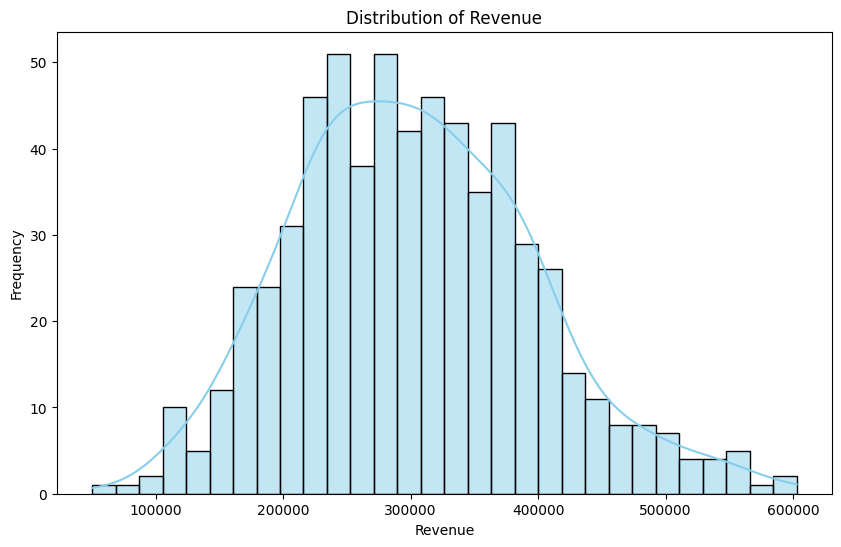

<ipython-input-26-f355274132fb>:25: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x="Geo", y="Revenue", data=df, palette="Set2")


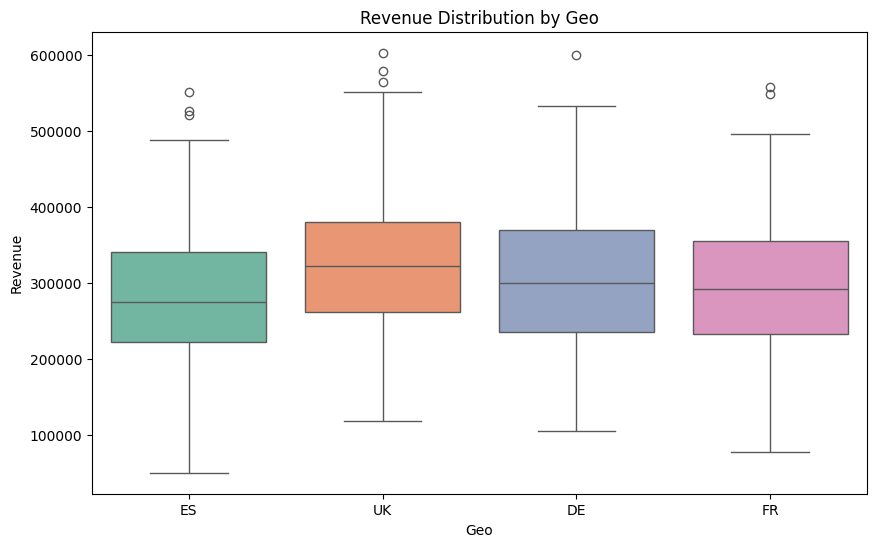

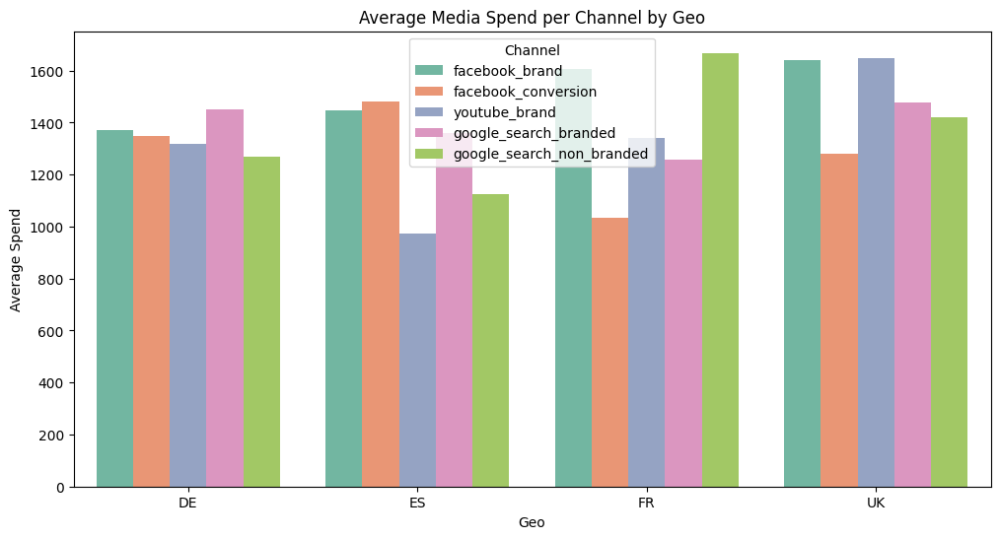

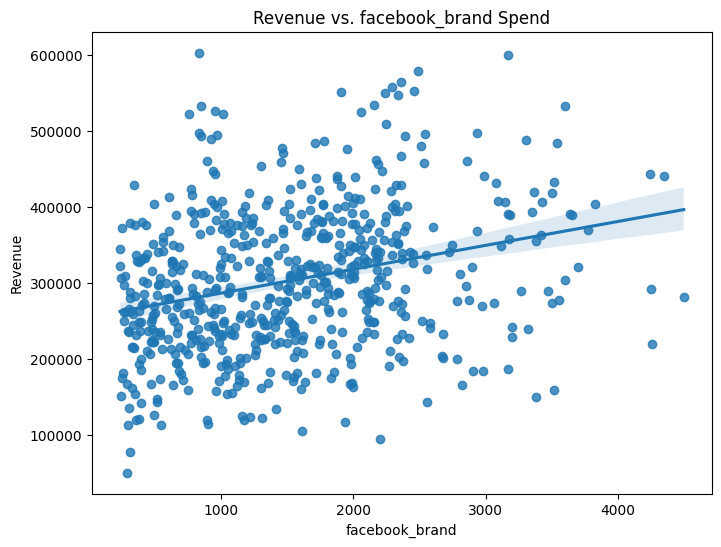

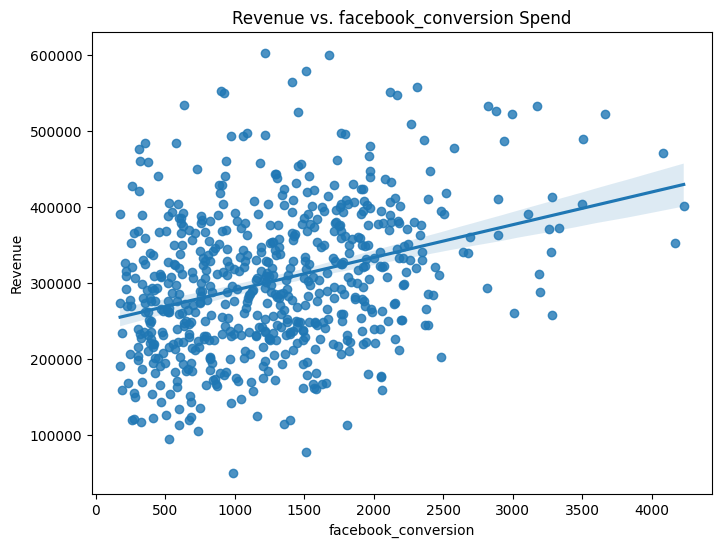

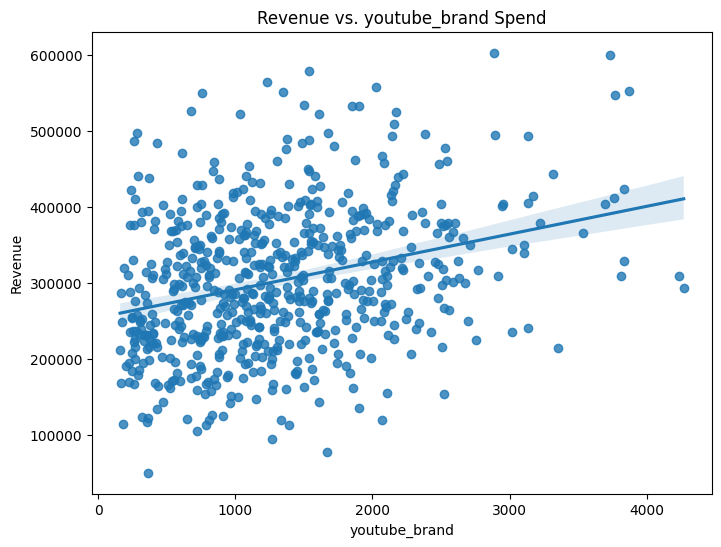

...

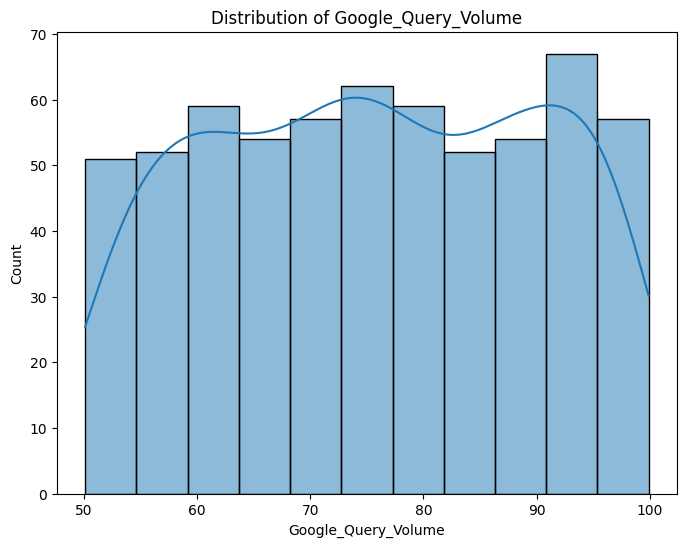

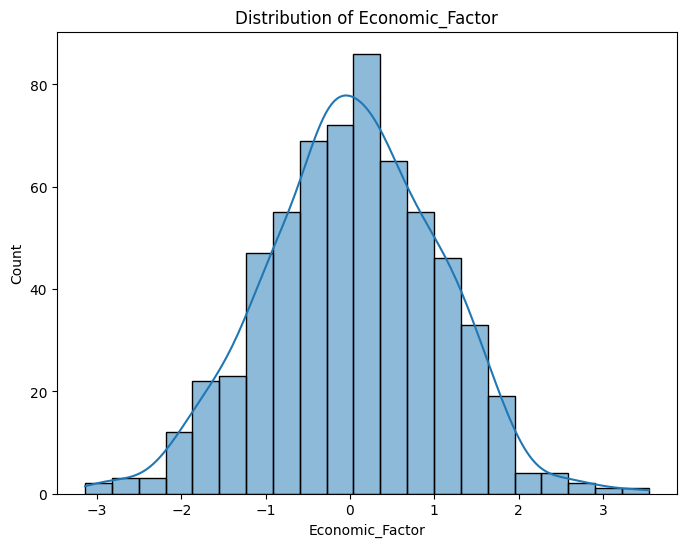

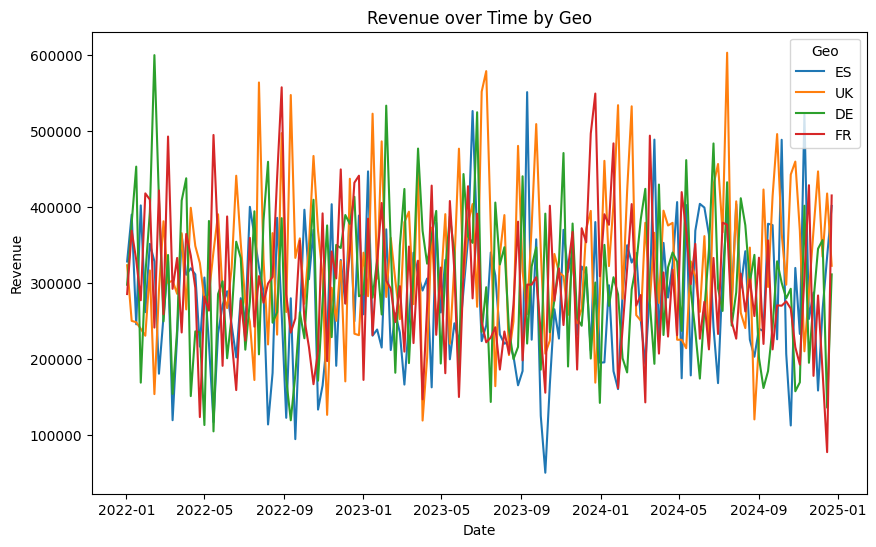

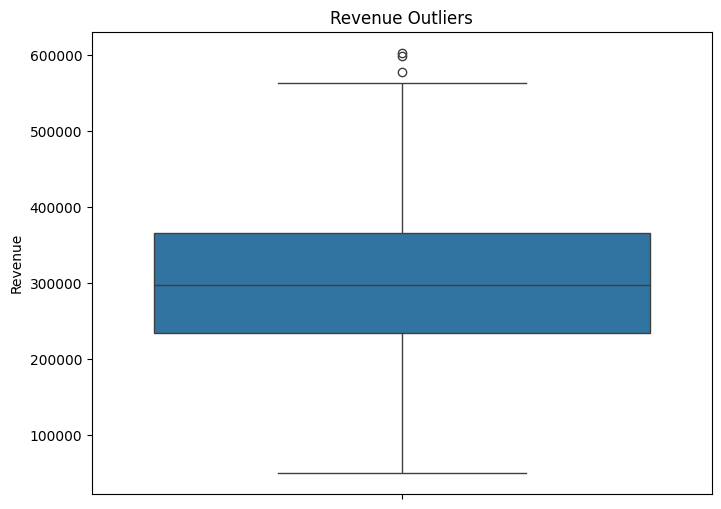

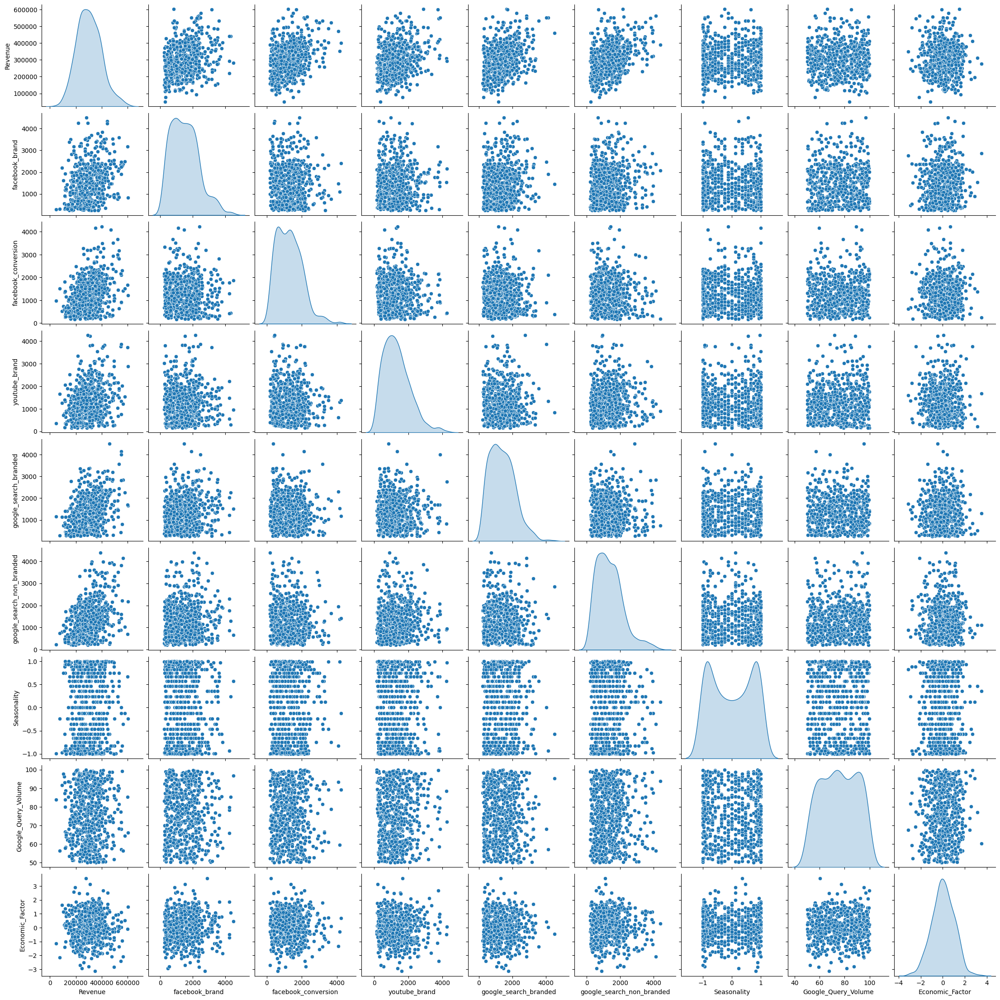

In [ ]:
# prompt: Run an EDA on the dataset df looking for insights on its validity for MMM
channels = ['facebook_brand', 'facebook_conversion', 'youtube_brand',
            'google_search_branded', 'google_search_non_branded']
control_vars = ['Seasonality', 'Google_Query_Volume', 'Economic_Factor']
kpi_name = "Revenue"  # KPI
# Check for missing values
print(df.isnull().sum())

# Check data types
print(df.dtypes)

# Check for duplicate rows
print(f"Number of duplicate rows: {df.duplicated().sum()}")

# Revenue Distribution (Histogram)
plt.figure(figsize=(10, 6))
sns.histplot(df["Revenue"], bins=30, kde=True, color="skyblue")
plt.title("Distribution of Revenue")
plt.xlabel("Revenue")
plt.ylabel("Frequency")
plt.show()

# Revenue by Geo (Box Plot)
plt.figure(figsize=(10, 6))
sns.boxplot(x="Geo", y="Revenue", data=df, palette="Set2")
plt.title("Revenue Distribution by Geo")
plt.xlabel("Geo")
plt.ylabel("Revenue")
plt.show()

# Average Media Spend per Channel by Geo (Bar Chart)
plt.figure(figsize=(12, 6))
avg_spend = df.groupby("Geo")[channels].mean().reset_index()
avg_spend_melt = pd.melt(avg_spend, id_vars="Geo", var_name="Channel", value_name="Avg_Spend")
sns.barplot(data=avg_spend_melt, x="Geo", y="Avg_Spend", hue="Channel", palette="Set2")
plt.title("Average Media Spend per Channel by Geo")
plt.xlabel("Geo")
plt.ylabel("Average Spend")
plt.legend(title="Channel")
plt.show()

# Explore the relationship between revenue and media spend for each channel
for channel in channels:
  plt.figure(figsize=(8, 6))
  sns.regplot(x=channel, y='Revenue', data=df)
  plt.title(f'Revenue vs. {channel} Spend')
  plt.show()

# Analyze the distribution of control variables
for var in control_vars:
  plt.figure(figsize=(8, 6))
  sns.histplot(df[var], kde=True)
  plt.title(f'Distribution of {var}')
  plt.show()

# Examine the seasonality effect on revenue
plt.figure(figsize=(10, 6))
sns.lineplot(x='Date', y='Revenue', hue='Geo', data=df)
plt.title('Revenue over Time by Geo')
plt.show()


# Check for outliers in revenue
plt.figure(figsize=(8, 6))
sns.boxplot(y='Revenue', data=df)
plt.title('Revenue Outliers')
plt.show()

# Investigate the relationship between revenue and other relevant variables
sns.pairplot(df[['Revenue'] + channels + control_vars], diag_kind='kde')
plt.show()


#Running Meridian MMM

In [ ]:
!pip install --upgrade google-meridian[colab,and-cuda]


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.4/60.4 kB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 813.6/813.6 kB 22.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.4/38.4 MB 18.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 590.7/590.7 MB 2.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 6.9/6.9 MB 61.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 412.6/412.6 MB 4.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 14.0/14.0 MB 43.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.0/22.0 MB 34.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.9/24.9 MB 59.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 867.7/867.7 kB 50.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 704.7/704.7 MB 1.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 98.8/98.8 MB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.

In [ ]:

import numpy as np
import pandas as pd
import tensorflow as tf
import tensorflow_probability as tfp
import arviz as az

import IPython

from meridian import constants
from meridian.data import load
from meridian.data import test_utils
from meridian.model import model
from meridian.model import spec
from meridian.model import prior_distribution
from meridian.analysis import optimizer
from meridian.analysis import analyzer
from meridian.analysis import visualizer
from meridian.analysis import summarizer
from meridian.analysis import formatter

# check if GPU is available
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))
print("Num GPUs Available: ", len(tf.config.experimental.list_physical_devices('GPU')))
print("Num CPUs Available: ", len(tf.config.experimental.list_physical_devices('CPU')))

Your runtime has 13.6 gigabytes of available RAM

Num GPUs Available:  1
Num CPUs Available:  1


# Step 1: Load and Map the data


In [ ]:
df.columns


Index(['Geo', 'Date', 'facebook_brand', 'facebook_conversion', 'youtube_brand',
       'google_search_branded', 'google_search_non_branded',
       'facebook_brand_exposure', 'facebook_conversion_exposure',
       'youtube_brand_exposure', 'google_search_branded_exposure',
       'google_search_non_branded_exposure', 'Seasonality',
       'Google_Query_Volume', 'Economic_Factor', 'Geo_Population',
       'Conversions', 'Revenue'],
      dtype='object')

In [ ]:
# prompt: Create a revenue_per_conversion column that is equal to revenue divided by conversions

df['revenue_per_conversion'] = df['Revenue'] / df['Conversions']


In [ ]:
df.head(10)

,Geo,Date,facebook_brand,facebook_conversion,youtube_brand,google_search_branded,google_search_non_branded,facebook_brand_exposure,facebook_conversion_exposure,youtube_brand_exposure,google_search_branded_exposure,google_search_non_branded_exposure,Seasonality,Google_Query_Volume,Economic_Factor,Geo_Population,Conversions,Revenue,revenue_per_conversion
0,ES,2022-01-02,704.550502,1834.017517,1088.234742,2027.678699,2326.884396,3.218723,6.535664,5.444691,4.952951,5.651110,6.432491e-16,75.814978,-0.458388,47000000,5796.320956,741913.201477,127.99726
1,ES,2022-01-09,3238.675594,1374.550611,1547.256572,2050.139186,1256.371711,3.755761,5.082668,4.980411,4.967369,4.926323,1.205367e-01,95.814754,0.006021,47000000,6170.988391,789869.606520,127.99726
2,ES,2022-01-16,1682.007021,960.944508,1281.138837,1067.898826,981.407952,3.818467,5.767127,5.476816,5.273113,4.359201,2.393157e-01,98.219372,-1.553647,47000000,4621.833197,591581.986140,127.99726
3,ES,2022-01-23,1874.530640,2227.305276,796.675579,2535.363137,1633.707210,3.797887,5.833771,4.775347,4.399012,5.799922,3.546049e-01,73.944490,0.139041,47000000,6201.443576,793767.786783,127.99726
4,ES,2022-01-30,637.052090,715.576087,2137.131541,998.194749,1603.638981,4.052711,5.378078,4.727232,4.761165,4.605936,4.647232e-01,80.777425,-0.316707,47000000,4661.843288,596703.168138,127.99726
5,ES,2022-02-06,2345.837734,1647.548523,1390.469670,864.506225,909.005921,4.368605,5.653487,4.972020,4.329907,3.254979,5.680647e-01,168.282776,-0.877220,47000000,5457.679185,698567.982534,127.99726
6,ES,2022-02-13,2098.396753,1084.188128,2124.543938,854.643555,1624.027074,4.335478,4.331989,5.788999,3.483871,5.328594,6.631227e-01,75.079378,0.046242,47000000,5034.858362,644448.075645,127.99726
7,ES,2022-02-20,982.210399,2035.606381,1471.708246,1114.477574,568.981482,3.728159,3.980825,5.355180,4.093842,3.581582,7.485107e-01,54.268609,-1.690196,47000000,3803.882713,486886.565260,127.99726
8,ES,2022-02-27,927.284941,1158.651526,474.949112,1259.430073,1498.677890,3.400954,5.471315,4.224933,4.522197,4.579590,8.229839e-01,144.403241,0.075627,47000000,4386.207509,561422.543716,127.99726
9,ES,2022-03-06,930.128118,1419.396268,1460.157716,1921.066132,1594.189305,3.434947,5.367467,4.065308,3.871531,4.794018,8.854560e-01,196.397468,0.470599,47000000,6428.878821,822878.875053,127.99726


In [ ]:

##We map our columns to the corresponding variables needed by Meridians Library.

coord_to_columns = load.CoordToColumns(
    time='Date', #week
    geo='Geo',
    controls=['Google_Query_Volume', 'Economic_Factor'],
    population='Geo_Population',
    kpi='Revenue',
    revenue_per_kpi='revenue_per_conversion',
    media=[
        'facebook_brand_exposure',
        'facebook_conversion_exposure',
        'youtube_brand_exposure',
        'google_search_branded_exposure',
        'google_search_non_branded_exposure',

    ],
    media_spend=[
        'facebook_brand',
        'facebook_conversion',
        'youtube_brand',
        'google_search_branded',
        'google_search_non_branded',
    ],
    #reach =['Channel4_reach', 'Channel5_reach'],
    #frequency=['Channel4_frequency', 'Channel5_frequency'],
    #rf_spend=['Channel4_spend', 'Channel5_spend'],
    #non_media_treatments=['Discount'],
)

correct_media_to_channel = {
    'facebook_brand_exposure': 'facebook_brand',
    'facebook_conversion_exposure': 'facebook_conversion',
    'youtube_brand_exposure': 'youtube_brand',
    'google_search_branded_exposure': 'google_search_branded',
    'google_search_non_branded_exposure': 'google_search_non_branded',

}

correct_media_spend_to_channel = {
    'facebook_brand': 'facebook_brand',
    'facebook_conversion': 'facebook_conversion',
    'youtube_brand': 'youtube_brand',
    'google_search_branded': 'google_search_branded',
    'google_search_non_branded': 'google_search_non_branded',
}




In [ ]:

#dataframe data loader
loader = load.DataFrameDataLoader(
    df=df,
    coord_to_columns= coord_to_columns,
    kpi_type= 'revenue',
    media_to_channel= correct_media_to_channel,
    media_spend_to_channel= correct_media_spend_to_channel,

)

data=loader.load()

/usr/local/lib/python3.11/dist-packages/meridian/data/load.py:1020: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  self.df[geo_column_name] = self.df[geo_column_name].replace(
/usr/local/lib/python3.11/dist-packages/meridian/data/load.py:201: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.dims`. To access a mapping from dimension names to lengths, please use `Dataset.sizes`.
  if (constants.GEO) not in self.dataset.dims.keys():
/usr/local/lib/python3.11/dist-packages/meridian/data/load.py:231: FutureWarning: The return type of `Dataset.dims` will be changed to return a set of dimension names in future, in order to be more consistent with `DataArray.d

# Configure the Model


In [ ]:
roi_rf_mu = 0.5     # Mu for ROI prior for each RF channel.
roi_rf_sigma = 0.8  # Sigma for ROI prior for each RF channel.
prior = prior_distribution.PriorDistribution(
    roi_rf=tfp.distributions.LogNormal(roi_rf_mu, roi_rf_sigma, name=constants.ROI_RF)
)
model_spec = spec.ModelSpec(prior=prior)

mmm = model.Meridian(input_data=data, model_spec=model_spec)

In [ ]:
%%time
mmm.sample_prior(550)
mmm.sample_posterior(n_chains=7, n_adapt=500, n_burnin=500, n_keep=1000)

CPU times: user 5min 48s, sys: 14.9 s, total: 6min 3s
Wall time: 6min 24s


/usr/local/lib/python3.11/dist-packages/arviz/data/inference_data.py:157: UserWarning: trace group is not defined in the InferenceData scheme
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/arviz/data/inference_data.py:1655: UserWarning: trace group is not defined in the InferenceData scheme
  warnings.warn(


In [ ]:
model_spec = spec.ModelSpec(
    prior=prior_distribution.PriorDistribution(),
    media_effects_dist='log_normal',
    hill_before_adstock=False,
    max_lag=8,
    unique_sigma_for_each_geo=False,
    paid_media_prior_type='roi',
    roi_calibration_period=None,
    rf_roi_calibration_period=None,
    knots=None,
    baseline_geo=None,
    holdout_id=None,
    control_population_scaling_id=None,
)


In [ ]:
%%time
meridian = model.Meridian(input_data=data, model_spec=model_spec)
meridian.sample_prior(600)
meridian.sample_posterior(n_chains=7, n_adapt=500, n_burnin=400, n_keep=950)

CPU times: user 5min 49s, sys: 14.5 s, total: 6min 4s
Wall time: 6min 12s


/usr/local/lib/python3.11/dist-packages/arviz/data/inference_data.py:157: UserWarning: trace group is not defined in the InferenceData scheme
  warnings.warn(
/usr/local/lib/python3.11/dist-packages/arviz/data/inference_data.py:1655: UserWarning: trace group is not defined in the InferenceData scheme
  warnings.warn(


# Step 3: Run model diagnostics

After the model is built, you must assess convergence, debug the model if needed, and then assess the model fit.



In [ ]:
#model diagnostics: enerate r-hat statistics. R-hat close to 1.0 indicate convergence. R-hat < 1.2 indicates approximate convergence and is a reasonable threshold for many problems.

model_diagnostics_priors = visualizer.ModelDiagnostics(mmm)
model_diagnostics_priors.plot_rhat_boxplot()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
#model diagnostics: enerate r-hat statistics. R-hat close to 1.0 indicate convergence. R-hat < 1.2 indicates approximate convergence and is a reasonable threshold for many problems.

model_diagnostics_no_priors = visualizer.ModelDiagnostics(meridian)
model_diagnostics_no_priors.plot_rhat_boxplot()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
model_diagnostics_priors.plot_prior_and_posterior_distribution()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.FacetChart(...)

In [ ]:
model_diagnostics_no_priors.plot_prior_and_posterior_distribution()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.FacetChart(...)

In [ ]:
# Assess the model's fit by comparing the expected sales against the actual sales.
model_fit_priors = visualizer.ModelFit(mmm)
model_fit_priors.plot_model_fit()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
model_fit_no_priors = visualizer.ModelFit(meridian)
model_fit_no_priors.plot_model_fit()

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


alt.LayerChart(...)

In [ ]:
mmm_summarizer = summarizer.Summarizer(mmm)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')


filepath = '/content/drive/MyDrive'
start_date = "2022-01-02"
end_date = "2024-12-22"
mmm_summarizer.output_model_results_summary('summary_output_priors.html', filepath, start_date, end_date)

Mounted at /content/drive


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: Futu

In [ ]:
mmm_summarizer = summarizer.Summarizer(meridian)
from google.colab import drive
drive.mount('/content/drive')


filepath = '/content/drive/MyDrive'
start_date = "2022-01-02"
end_date = "2024-12-22"
mmm_summarizer.output_model_results_summary('summary_output_no_priors.html', filepath, start_date, end_date)

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: Futu

In [ ]:
IPython.display.HTML(filename='/content/drive/MyDrive/summary_output_priors.html')


Dataset,R-squared,MAPE,wMAPE
All Data,0.95,3%,3%


In [ ]:
IPython.display.HTML(filename='/content/drive/MyDrive/summary_output_no_priors.html')


Dataset,R-squared,MAPE,wMAPE
All Data,0.95,3%,3%


In [ ]:
%%time
budget_optimizer_priors = optimizer.BudgetOptimizer(mmm)
optimization_results_priors = budget_optimizer_priors.optimize()


CPU times: user 36.7 s, sys: 1.73 s, total: 38.5 s
Wall time: 38.4 s


In [ ]:
%%time
budget_optimizer_no_priors = optimizer.BudgetOptimizer(meridian)
optimization_results_no_priors = budget_optimizer_no_priors.optimize()


CPU times: user 36.9 s, sys: 1.74 s, total: 38.7 s
Wall time: 38.6 s


In [ ]:

filepath = '/content/drive/MyDrive'
optimization_results_priors.output_optimization_summary('optimization_output_priors.html', filepath)


IPython.display.HTML(filename='/content/drive/MyDrive/optimization_output_priors.html')

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: Futu

Channel,Non-optimized spend,Optimized spend
google_search_non_branded,20%,26%
facebook_brand,22%,21%
google_search_branded,20%,19%
facebook_conversion,19%,17%
youtube_brand,19%,17%


In [ ]:

filepath = '/content/drive/MyDrive'
optimization_results_no_priors.output_optimization_summary('optimization_output_no_priors.html', filepath)


IPython.display.HTML(filename='/content/drive/MyDrive/optimization_output_no_priors.html')

/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: Futu

Channel,Non-optimized spend,Optimized spend
google_search_non_branded,20%,22%
facebook_brand,22%,21%
google_search_branded,20%,20%
youtube_brand,19%,18%
facebook_conversion,19%,18%


In [ ]:
%%time
budget_optimizer = optimizer.BudgetOptimizer(meridian)
optimization_results_flexible = budget_optimizer.optimize(budget=10000000)


filepath = '/content/drive/MyDrive'
optimization_results_flexible.output_optimization_summary('flexible_optimization_output.html', filepath)


IPython.display.HTML(filename='/content/drive/MyDrive/flexible_optimization_output.html')


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


CPU times: user 32.3 s, sys: 1.41 s, total: 33.7 s
Wall time: 34.6 s


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


Channel,Non-optimized spend,Optimized spend
google_search_non_branded,20%,22%
facebook_brand,22%,21%
google_search_branded,20%,20%
youtube_brand,19%,19%
facebook_conversion,19%,19%


In [ ]:
%%time
budget_optimizer = optimizer.BudgetOptimizer(mmm)
optimization_results_flexible = budget_optimizer.optimize(budget=10000000)


filepath = '/content/drive/MyDrive'
optimization_results_flexible.output_optimization_summary('flexible_optimization_output_priors.html', filepath)


IPython.display.HTML(filename='/content/drive/MyDrive/flexible_optimization_output_priors.html')


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)
/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


CPU times: user 31.7 s, sys: 1.47 s, total: 33.1 s
Wall time: 33.4 s


/usr/local/lib/python3.11/dist-packages/altair/utils/core.py:384: FutureWarning: the convert_dtype parameter is deprecated and will be removed in a future version.  Do ``ser.astype(object).apply()`` instead if you want ``convert_dtype=False``.
  col = df[col_name].apply(to_list_if_array, convert_dtype=False)


Channel,Non-optimized spend,Optimized spend
google_search_non_branded,20%,26%
facebook_brand,22%,21%
google_search_branded,20%,19%
facebook_conversion,19%,17%
youtube_brand,19%,17%


In [ ]:
file_path='/content/drive/MyDrive/saved_mmm.pkl'
model.save_mmm(mmm, file_path)

#Run the following codes to load the saved model:


mmm = model.load_mmm(file_path)